### Imports

In [1]:
import glob
import os
import sys

from panel.io.handlers import display

sys.path.append("AudioCLIP")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from typing import List, Optional, Dict, Any, Tuple
from PIL import Image
from tqdm import tqdm
from torchview import draw_graph
import umap
from sklearn.manifold import TSNE
from torch.nn.functional import cosine_similarity
from model import AudioCLIP
from plotly.subplots import make_subplots
import glob
from utils.transforms import ToTensor1D
import torchvision as tv

from plotly_tools import *
import plotly.express as px
from pathlib import Path
import torch
import librosa
import graphviz
graphviz.set_jupyter_format('png')
from transformers import AlignModel, AlignProcessor, AlignTextConfig, AlignVisionConfig

os.environ["HF_HOME"] = "../.hf_home"
random_seed = 42
torch.manual_seed(random_seed)
device = "mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: mps


### Constants & Transforms

In [2]:
MODEL_FILENAME = 'AudioCLIP-Full-Training.pt'
SAMPLE_RATE = 44100
IMAGE_SIZE = 224
IMAGE_MEAN = 0.48145466, 0.4578275, 0.40821073
IMAGE_STD = 0.26862954, 0.26130258, 0.27577711

In [3]:
audio_transforms = ToTensor1D()

image_transforms = tv.transforms.Compose([
    tv.transforms.ToTensor(),
    tv.transforms.Resize(IMAGE_SIZE, interpolation=Image.BICUBIC),
    tv.transforms.CenterCrop(IMAGE_SIZE),
    tv.transforms.Normalize(IMAGE_MEAN, IMAGE_STD)
])

### Helper Function

In [4]:
def load_audio(path: str):
    with torch.no_grad():
        track, _ = librosa.load(path ,sr=SAMPLE_RATE, dtype=np.float32)

        # compute spectrograms using trained audio-head (fbsp-layer of ESResNeXt)
        # thus, the actual time-frequency representation will be visualized
        spec = model.audio.spectrogram(torch.from_numpy(track.reshape(1, 1, -1)))
        spec = np.ascontiguousarray(spec.numpy()).view(np.complex64)
        pow_spec = 10 * np.log10(np.abs(spec) ** 2 + 1e-18).squeeze()

        return audio_transforms(track.reshape(1, -1))

def load_image(path: str):
    image = Image.open(path).convert("RGB")
    image = np.array(image)

    return image_transforms(image)

### Load Model & Processor

In [5]:
model = AudioCLIP(pretrained=f'./AudioCLIP/assets/{MODEL_FILENAME}')

### Load Images and Audio

In [6]:
input_prefix='./AudioCLIP/demo'

images = [load_image(imgpath) for imgpath in glob.glob(f'{input_prefix}/images/*.jpg')]
images = torch.stack(images)
image_labels = [Path(imgpath).stem for imgpath in glob.glob(f'{input_prefix}/images/*.jpg')]
assert len(images) == len(image_labels), "Something went wrong."

audio = [load_audio(audpath) for audpath in glob.glob(f'{input_prefix}/audio/*.wav')]
audio = torch.stack(audio)
audio_labels = [Path(audpath).stem for audpath in glob.glob(f'{input_prefix}/audio/*.wav')]
assert len(audio) == len(audio_labels), "Something went wrong."

LABELS = ['cat', 'thunderstorm', 'coughing', 'alarm clock', 'car horn']
text = [[label] for label in LABELS]

#### Switch model to eval mode

In [7]:
_ = model.eval()

### Model architecture exploration

#### Image Size & Audio Length

In [8]:
images[0].shape, audio[0].shape

(torch.Size([3, 224, 224]), torch.Size([1, 220500]))

#### Model Pipeline Visualization

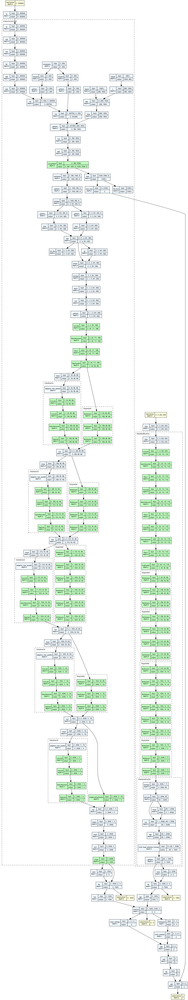

In [9]:
graph = draw_graph(model, input_size=[(1,220500), (1,3,224,224)], dtypes=[torch.float32, torch.float32, torch.long], expand_nested=True)
graph.visual_graph

### Helper Functions

### Run Inference on Custom Images and Captions

In [10]:
with torch.no_grad():
    ((audio_features, _, _), _), _ = model(audio=audio)
    ((_, image_features, _), _), _ = model(image=images)
    ((_, _, text_features), _), _ = model(text=text)

    audio_features = audio_features / torch.linalg.norm(audio_features, dim=-1, keepdim=True)
    image_features = image_features / torch.linalg.norm(image_features, dim=-1, keepdim=True)
    text_features = text_features / torch.linalg.norm(text_features, dim=-1, keepdim=True)

    scale_audio_image = torch.clamp(model.logit_scale_ai.exp(), min=1.0, max=100.0)
    scale_audio_text = torch.clamp(model.logit_scale_at.exp(), min=1.0, max=100.0)
    scale_image_text = torch.clamp(model.logit_scale.exp(), min=1.0, max=100.0)

    logits_audio_image = scale_audio_image * audio_features @ image_features.T
    logits_audio_text = scale_audio_text * audio_features @ text_features.T
    logits_image_text = scale_image_text * image_features @ text_features.T

    confidence_audio_image = logits_audio_image.softmax(dim=1)
    confidence_audio_text = logits_audio_text.softmax(dim=1)
    confidence_image_text = logits_image_text.softmax(dim=1)

##### Embedding Similarity Matrix

In [11]:
# heatmap visualization of image-text similarity, text-audio similarity, and image-audio similarity
fig = make_subplots(rows=1, cols=3, subplot_titles=("Image-Text Similarity", "Audio-Text Similarity", "Image-Audio Similarity"), horizontal_spacing = 0.12)
fig.add_trace(
    go.Heatmap(
        z=confidence_image_text.cpu().numpy(),
        x=LABELS,
        y=image_labels,
        colorscale='Viridis'
    ),
    row=1, col=1
)
fig.add_trace(
    go.Heatmap(
        z=confidence_audio_text.cpu().numpy(),
        x=LABELS,
        y=audio_labels,
        colorscale='Viridis'
    ),
    row=1, col=2
)
fig.add_trace(
    go.Heatmap(
        z=confidence_audio_image.cpu().numpy(),
        x=image_labels,
        y=audio_labels,
        colorscale='Viridis'
    ),
    row=1, col=3
)
fig.update_layout(height=600, width=1600, title_text="Similarity Matrices")
fig.show()

#### Compute Dimensionality Reduction

In [12]:
combined_embeddings = torch.cat([
    audio_features,   # 5 audio embeddings
    image_features,   # 5 image embeddings
    text_features     # 5 text embeddings
], dim=0).cpu().numpy()

##### t-SNE

In [13]:
tsne = TSNE(
    n_components=3,
    perplexity=5,
    learning_rate='auto',
    init='pca',
    random_state=random_seed,
)

tsne_embeddings = tsne.fit_transform(combined_embeddings)
tsne_audio = tsne_embeddings[:len(audio_features)]
tsne_image = tsne_embeddings[len(audio_features):len(audio_features)+len(image_features)]
tsne_text = tsne_embeddings[len(audio_features)+len(image_features):]

assert len(tsne_audio) == len(audio_features), "Audio embedding length wrong"
assert len(tsne_image) == len(image_features), "Image embedding length wrong"
assert len(tsne_text) == len(text_features), "Text embedding length wrong"

/Users/riverfog7/Workspace/AISogang/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning:

divide by zero encountered in matmul

/Users/riverfog7/Workspace/AISogang/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning:

overflow encountered in matmul

/Users/riverfog7/Workspace/AISogang/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:350: RuntimeWarning:

invalid value encountered in matmul

/Users/riverfog7/Workspace/AISogang/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning:

divide by zero encountered in matmul

/Users/riverfog7/Workspace/AISogang/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning:

overflow encountered in matmul

/Users/riverfog7/Workspace/AISogang/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:351: RuntimeWarning:

invalid value encountered in matmul

/Users/riverfog7/Workspace/AISogang/.venv/lib/python3.12/site-packages/sklearn

##### UMAP

In [14]:
umap = umap.UMAP(
    n_neighbors=5,
    min_dist=0.3,
    n_components=3,
    random_state=random_seed
)

umap_embeddings = umap.fit_transform(combined_embeddings)
umap_audio = umap_embeddings[:len(audio_features)]
umap_image = umap_embeddings[len(audio_features):len(audio_features)+len(image_features)]
umap_text = umap_embeddings[len(audio_features)+len(image_features):]

assert len(umap_audio) == len(audio_features), "Audio embedding length wrong"
assert len(umap_image) == len(image_features), "Image embedding length wrong"
assert len(umap_text) == len(text_features), "Text embedding length wrong"

/Users/riverfog7/Workspace/AISogang/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



#### Visualization

In [15]:
def build_dataframe(
        audio: np.ndarray,
        image: np.ndarray,
        text: np.ndarray,
        audio_labels: List[str],
        image_labels: List[str],
        text_labels: List[str],
        classes: List[str],
) -> pd.DataFrame:
    marker_types = {
        'audio': 'circle',
        'image': 'square',
        'text': 'diamond'
    }
    marker_colors = {}
    palette = sns.color_palette("hsv", len(classes)).as_hex()
    for cls in classes:
        marker_colors[cls] = palette[classes.index(cls)]

    df_audio = pd.DataFrame(columns=['x', 'y', 'z'])
    df_image = pd.DataFrame(columns=['x', 'y', 'z'])
    df_text = pd.DataFrame(columns=['x', 'y', 'z'])

    df_audio['x'] = audio[:, 0]
    df_audio['y'] = audio[:, 1]
    df_audio['z'] = audio[:, 2]
    df_image['x'] = image[:, 0]
    df_image['y'] = image[:, 1]
    df_image['z'] = image[:, 2]
    df_text['x'] = text[:, 0]
    df_text['y'] = text[:, 1]
    df_text['z'] = text[:, 2]

    df_audio['class'] = audio_labels
    df_text['class'] = text_labels
    df_image['class'] = image_labels

    df_audio['marker_type'] = marker_types['audio']
    df_text['marker_type'] = marker_types['text']
    df_image['marker_type'] = marker_types['image']

    df_audio['marker_color'] = df_audio['class'].map(lambda x: [marker_colors[c] for c in classes if c in x][0])
    df_text['marker_color'] = df_text['class'].map(lambda x: [marker_colors[c] for c in classes if c in x][0])
    df_image['marker_color'] = df_image['class'].map(lambda x: [marker_colors[c] for c in classes if c in x][0])

    df = pd.concat([df_audio, df_image, df_text], ignore_index=True)
    return df

In [16]:
def plot_df(df: pd.DataFrame, title: str = "3D Scatter Plot"):
    fig = px.scatter_3d(
        df,
        x='x',
        y='y',
        z='z',
        color='class',
        symbol='marker_type',
        color_discrete_map={row['class']: row['marker_color'] for _, row in df.iterrows()},
        symbol_map={'audio': 'circle', 'image': 'square', 'text': 'diamond'},
        hover_data=['class', 'marker_type'],
        title=title
    )
    fig.update_traces(marker=dict(size=8))
    fig.update_layout(width=800, height=700)
    fig.show()

##### t-SNE

In [17]:
df_tsne = build_dataframe(
    audio=tsne_audio,
    image=tsne_image,
    text=tsne_text,
    audio_labels=audio_labels,
    image_labels=image_labels,
    text_labels=LABELS,
    classes=['clock', 'cough', 'light', 'thunder', 'car', 'cat']
)

In [18]:
plot_df(df_tsne, title="t-SNE Embeddings")

##### UMAP

In [19]:
df_umap = build_dataframe(
    audio=umap_audio,
    image=umap_image,
    text=umap_text,
    audio_labels=audio_labels,
    image_labels=image_labels,
    text_labels=LABELS,
    classes=['clock', 'cough', 'light', 'thunder', 'car', 'cat']
)

In [20]:
plot_df(df_umap, title="UMAP Embeddings")

### Create Dataset

In [21]:
from dataset_utils import *
import json
from tqdm import tqdm
import shutil

dataset_base = Path('./dataset')
dataset_base.mkdir(exist_ok=True, parents=True)

class_metadata = dataset_base / "class_metadata.json"
if not class_metadata.exists():
    result = generate_classes(10)
    classes = result['classes']
    queries = result['video_queries']
    with open(class_metadata, 'w') as f:
        json.dump(result, f, indent=4)
else:
    with open(class_metadata, 'r') as f:
        result = json.load(f)
    classes = result['classes']
    queries = result['video_queries']

for query in queries:
    if (dataset_base / query / "metadata.txt").exists():
        print(f"Skipping {query}, already exists.")
        continue
    if (dataset_base / query).exists():
        print(f"Removing existing directory for {query}.")
        shutil.rmtree(dataset_base / query)
    videos = search_yt(query, count=1)
    for i, video in enumerate(tqdm(videos, desc=f"Downloading videos for query: {query}")):
        dest = dataset_base / query / str(i)
        video_path = download_video(video, dest / "video")
        process_downloaded_video(video_path, dest)
    with open(dataset_base / query / "metadata.txt", 'w') as f:
        for i, video in enumerate(videos):
            f.write(f"{i}: {video}\n")

Skipping guitar playing tutorial, already exists.
Skipping acoustic guitar performance, already exists.
Skipping electric guitar solo live, already exists.
Skipping beginner guitar lessons, already exists.
Skipping fingerstyle guitar cover, already exists.
Skipping italian pasta recipe, already exists.
Skipping cooking spaghetti step by step, already exists.
Skipping homemade pasta dough, already exists.
Skipping pesto pasta preparation, already exists.
Skipping vegan pasta dish, already exists.
Skipping marathon training run, already exists.
Skipping full marathon race footage, already exists.
Skipping running marathon tips, already exists.
Skipping amateur marathon finish, already exists.
Skipping professional marathon highlights, already exists.
Skipping ballet dance routine, already exists.
Skipping classical ballet performance, already exists.
Skipping ballet solo excerpt, already exists.
Skipping beginner ballet class, already exists.
Skipping ballet company rehearsal, already ex

### Run Inference on Dataset

#### Helper Functions

In [22]:
def process_audio(paths: List[Path]) -> torch.Tensor:
    # compensate for different audio lengths by cutting to the shortest length
    min_length = min([librosa.get_duration(path=str(path)) for path in paths])
    min_length_samples = int(min_length * SAMPLE_RATE)
    audios = []
    for path in paths:
        track, _ = librosa.load(path ,sr=SAMPLE_RATE, dtype=np.float32)
        track = track[:min_length_samples]
        audios.append(audio_transforms(track.reshape(1, -1)))
    return torch.stack(audios)

def process_image(paths: List[Path]) -> torch.Tensor:
    images = []
    for path in paths:
        image = Image.open(path).convert("RGB")
        image = np.array(image)
        images.append(image_transforms(image))
    return torch.stack(images)

def process_text(classes: List[str]) -> List[List[str]]:
    return [[cls] for cls in classes]

def process_video_entry(path: Path) -> Tuple[torch.Tensor, torch.Tensor]:
    audio_paths = sorted(path.glob("audio_*.wav"))
    image_paths = sorted(path.glob("image_*.jpg"))

    audios = process_audio(audio_paths)
    images = process_image(image_paths)

    return audios, images

def show(path: Path):
    if path.suffix == '.wav':
        display(Audio(str(path)))
    elif path.suffix in ['.jpg', '.png', '.jpeg']:
        image = Image.open(path).convert("RGB")
        display(image)
    else:
        print(f"Unsupported file type: {path.suffix}")

def embed_text(text: str) -> np.ndarray:
    with torch.no_grad():
        ((_, _, text_features), _), _ = model(text=[[text]])
        text_features = text_features / torch.linalg.norm(text_features, dim=-1, keepdim=True)
        return text_features.cpu().numpy()[0]

#### Dataset Classes

In [23]:
import pickle
from typing import Dict, List, Tuple, Optional
from pathlib import Path
import numpy as np
import torch
from IPython.lib.display import Audio
from IPython.display import display
from PIL import Image
import sys

class VideoData:
    def __init__(self, base_path: Path, model: AudioCLIP, device: str, load_from_cache: bool = False):
        self.base_path = base_path.absolute()
        self.model = model
        self.device = device
        self.video = base_path / "video.mkv"
        self.audio_paths = []
        self.frame_paths = []
        self.audio = []
        self.frame = []
        self.audio_embeddings = None
        self.frame_embeddings = None
        self.audio_embedding_map = {}
        self.frame_embedding_map = {}

        if not load_from_cache:
            self._load_data()
            self._load_embeddings()

    def _load_data(self):
        self.audio_paths = list(map(lambda x: x.absolute(), sorted(self.base_path.glob("audio/*.wav"))))
        self.frame_paths = list(map(lambda x: x.absolute(), sorted(self.base_path.glob("frames/*.jpg"))))

        if len(self.audio_paths) > 0:
            self.audio = process_audio(self.audio_paths)
        if len(self.frame_paths) > 0:
            self.frame = process_image(self.frame_paths)

    def _load_embeddings(self):
        with torch.no_grad():
            if len(self.audio) > 0:
                self.model.to(self.device)
                ((audio_features, _, _), _), _ = self.model(audio=self.audio.to(self.device))
                audio_features = audio_features / torch.linalg.norm(audio_features, dim=-1, keepdim=True)
                self.audio_embeddings = audio_features.cpu().numpy()

            if len(self.frame) > 0:
                self.model.to(self.device)
                ((_, image_features, _), _), _ = self.model(image=self.frame.to(self.device))
                image_features = image_features / torch.linalg.norm(image_features, dim=-1, keepdim=True)
                self.frame_embeddings = image_features.cpu().numpy()

        if self.audio_embeddings is not None and len(self.audio_embeddings) > 0:
            self.audio_embedding_map = {path: emb for path, emb in zip(self.audio_paths, self.audio_embeddings)}
        if self.frame_embeddings is not None and len(self.frame_embeddings) > 0:
            self.frame_embedding_map = {path: emb for path, emb in zip(self.frame_paths, self.frame_embeddings)}

    def search(self, text_embedding: np.ndarray, return_scores: bool = False) -> Dict[str, List[Tuple[Path, float]]]:
        results = {
            "audio": [],
            "frame": []
        }

        text_emb_tensor = torch.from_numpy(text_embedding).unsqueeze(0).to(self.device)

        with torch.no_grad():
            if len(self.audio_embedding_map) > 0:
                scale_audio_text = torch.clamp(self.model.logit_scale_at.exp(), min=1.0, max=100.0)

                audio_emb_stacked = torch.from_numpy(np.stack([emb for emb in self.audio_embedding_map.values()])).to(self.device)
                logits_audio = scale_audio_text * (audio_emb_stacked @ text_emb_tensor.T).squeeze(-1)

                if return_scores:
                    scores = logits_audio
                else:
                    scores = torch.softmax(logits_audio, dim=0)

                scores_np = scores.cpu().numpy()
                for path, score in zip(self.audio_embedding_map.keys(), scores_np):
                    results["audio"].append((path, float(score)))

            if len(self.frame_embedding_map) > 0:
                scale_image_text = torch.clamp(self.model.logit_scale.exp(), min=1.0, max=100.0)

                frame_emb_stacked = torch.from_numpy(np.stack([emb for emb in self.frame_embedding_map.values()])).to(self.device)
                logits_frame = scale_image_text * (frame_emb_stacked @ text_emb_tensor.T).squeeze(-1)

                if return_scores:
                    scores = logits_frame
                else:
                    scores = torch.softmax(logits_frame, dim=0)

                scores_np = scores.cpu().numpy()
                for path, score in zip(self.frame_embedding_map.keys(), scores_np):
                    results["frame"].append((path, float(score)))

        return results

    def search_top_k(self, text_embedding: np.ndarray, k: int = 5, modality: str = 'all') -> Dict[str, List[Tuple[Path, float]]]:
        all_results = self.search(text_embedding, return_scores=True)
        top_k_results = {}

        if modality in ['audio', 'all'] and len(all_results['audio']) > 0:
            sorted_audio = sorted(all_results['audio'], key=lambda x: x[1], reverse=True)[:k]
            top_k_results['audio'] = sorted_audio

        if modality in ['frame', 'all'] and len(all_results['frame']) > 0:
            sorted_frames = sorted(all_results['frame'], key=lambda x: x[1], reverse=True)[:k]
            top_k_results['frame'] = sorted_frames

        return top_k_results

    def save(self, filepath: Path):
        data = {
            'base_path': str(self.base_path),
            'audio_paths': [str(p) for p in self.audio_paths],
            'frame_paths': [str(p) for p in self.frame_paths],
            'audio_embeddings': self.audio_embeddings,
            'frame_embeddings': self.frame_embeddings,
        }
        with open(filepath, 'wb') as f:
            pickle.dump(data, f)

    @classmethod
    def load(cls, filepath: Path, model: AudioCLIP, device: str = device):
        with open(filepath, 'rb') as f:
            data = pickle.load(f)

        instance = cls.__new__(cls)
        instance.base_path = Path(data['base_path'])
        instance.model = model
        instance.device = device
        instance.video = instance.base_path / "video.mkv"
        instance.audio_paths = [Path(p) for p in data['audio_paths']]
        instance.frame_paths = [Path(p) for p in data['frame_paths']]
        instance.audio = []
        instance.frame = []
        instance.audio_embeddings = data['audio_embeddings']
        instance.frame_embeddings = data['frame_embeddings']

        if instance.audio_embeddings is not None and len(instance.audio_embeddings) > 0:
            instance.audio_embedding_map = {path: emb for path, emb in zip(instance.audio_paths, instance.audio_embeddings)}
        else:
            instance.audio_embedding_map = {}

        if instance.frame_embeddings is not None and len(instance.frame_embeddings) > 0:
            instance.frame_embedding_map = {path: emb for path, emb in zip(instance.frame_paths, instance.frame_embeddings)}
        else:
            instance.frame_embedding_map = {}

        return instance


class VideoDatasetClass:
    def __init__(self, query_name: str, base_path: Path, model: AudioCLIP, device: str = device):
        self.query_name = query_name
        self.base_path = base_path.absolute()
        self.model = model
        self.device = device
        self.video_data_list: List[VideoData] = []
        self.metadata = {}

        self._load_metadata()
        self._load_videos()

    def _load_metadata(self):
        metadata_file = self.base_path / "metadata.txt"
        if metadata_file.exists():
            with open(metadata_file, 'r') as f:
                for line in f:
                    if ':' in line:
                        vid_id, url = line.strip().split(': ', 1)
                        self.metadata[int(vid_id)] = url

    def _load_videos(self):
        for video_dir in sorted(self.base_path.iterdir()):
            if not video_dir.is_dir():
                continue
            try:
                video_id = int(video_dir.name)
                video_data = VideoData(video_dir, self.model, self.device)
                self.video_data_list.append(video_data)
            except ValueError:
                continue

    def search(self, text_embedding: np.ndarray, return_scores: bool = False) -> List[Dict]:
        all_results = []
        for idx, video_data in enumerate(self.video_data_list):
            video_results = video_data.search(text_embedding, return_scores=return_scores)
            all_results.append({
                'video_id': idx,
                'video_path': video_data.base_path,
                'audio_results': video_results['audio'],
                'frame_results': video_results['frame']
            })
        return all_results

    def search_top_k(self, text_embedding: np.ndarray, k: int = 5, modality: str = 'all') -> Dict[str, List[Tuple[Path, float, int]]]:
        all_audio = []
        all_frames = []

        for idx, video_data in enumerate(self.video_data_list):
            results = video_data.search(text_embedding, return_scores=True)
            for path, score in results['audio']:
                all_audio.append((path, score, idx))
            for path, score in results['frame']:
                all_frames.append((path, score, idx))

        top_k_results = {}
        if modality in ['audio', 'all'] and len(all_audio) > 0:
            sorted_audio = sorted(all_audio, key=lambda x: x[1], reverse=True)[:k]
            top_k_results['audio'] = sorted_audio

        if modality in ['frame', 'all'] and len(all_frames) > 0:
            sorted_frames = sorted(all_frames, key=lambda x: x[1], reverse=True)[:k]
            top_k_results['frame'] = sorted_frames

        return top_k_results

    def save(self, filepath: Path):
        filepath.mkdir(parents=True, exist_ok=True)

        data = {
            'query_name': self.query_name,
            'base_path': str(self.base_path),
            'metadata': self.metadata,
            'num_videos': len(self.video_data_list)
        }

        with open(filepath / 'class_info.pkl', 'wb') as f:
            pickle.dump(data, f)

        for idx, video_data in enumerate(self.video_data_list):
            video_data.save(filepath / f'video_{idx}.pkl')

    @classmethod
    def load(cls, filepath: Path, model: AudioCLIP, device: str = device):
        with open(filepath / 'class_info.pkl', 'rb') as f:
            data = pickle.load(f)

        instance = cls.__new__(cls)
        instance.query_name = data['query_name']
        instance.base_path = Path(data['base_path'])
        instance.model = model
        instance.device = device
        instance.metadata = data['metadata']
        instance.video_data_list = []

        for idx in range(data['num_videos']):
            video_data = VideoData.load(filepath / f'video_{idx}.pkl', model, device)
            instance.video_data_list.append(video_data)

        return instance


class VideoDataset:
    def __init__(self, base_path: Path, model: AudioCLIP, device: str = device):
        self.base_path = base_path.absolute()
        self.model = model
        self.device = device
        self.classes: Dict[str, VideoDatasetClass] = {}
        self.class_metadata = {}
        self.text_embeddings = {}

        self._load_class_metadata()
        self._load_classes()
        self._compute_text_embeddings()

    def _load_class_metadata(self):
        metadata_file = self.base_path / "class_metadata.json"
        if metadata_file.exists():
            import json
            with open(metadata_file, 'r') as f:
                self.class_metadata = json.load(f)

    def _load_classes(self):
        for query_dir in sorted(self.base_path.iterdir()):
            if not query_dir.is_dir():
                continue
            query_name = query_dir.name
            video_class = VideoDatasetClass(query_name, query_dir, self.model, self.device)
            if len(video_class.video_data_list) > 0:
                self.classes[query_name] = video_class

    def _compute_text_embeddings(self):
        if 'classes' in self.class_metadata:
            class_names = [cls['name'].lower() if isinstance(cls, dict) else cls.lower()
                          for cls in self.class_metadata['classes']]
            text_processed = [[name] for name in class_names]

            with torch.no_grad():
                self.model.to(self.device)
                ((_, _, text_features), _), _ = self.model(text=text_processed)
                text_features = text_features / torch.linalg.norm(text_features, dim=-1, keepdim=True)
                text_embeddings = text_features.cpu().numpy()

            self.text_embeddings = {name: emb for name, emb in zip(class_names, text_embeddings)}

    def search(self, query: str, k: int = 10, modality: str = 'all') -> Dict[str, List[Tuple[Path, float, str]]]:
        if query.lower() in self.text_embeddings:
            text_embedding = self.text_embeddings[query.lower()]
        else:
            with torch.no_grad():
                self.model.to(self.device)
                ((_, _, text_features), _), _ = self.model(text=[[query]])
                text_features = text_features / torch.linalg.norm(text_features, dim=-1, keepdim=True)
                text_embedding = text_features.cpu().numpy()[0]

        all_audio = []
        all_frames = []

        for class_name, video_class in self.classes.items():
            for video_data in video_class.video_data_list:
                results = video_data.search(text_embedding, return_scores=True)
                for path, score in results['audio']:
                    all_audio.append((path, score, class_name))
                for path, score in results['frame']:
                    all_frames.append((path, score, class_name))

        search_results = {}
        if modality in ['audio', 'all'] and len(all_audio) > 0:
            sorted_audio = sorted(all_audio, key=lambda x: x[1], reverse=True)[:k]
            search_results['audio'] = sorted_audio

        if modality in ['frame', 'all'] and len(all_frames) > 0:
            sorted_frames = sorted(all_frames, key=lambda x: x[1], reverse=True)[:k]
            search_results['frame'] = sorted_frames

        return search_results

    def search_by_class(self, query: str, class_name: str, k: int = 10, modality: str = 'all') -> Dict[str, List[Tuple[Path, float]]]:
        if class_name not in self.classes:
            raise ValueError(f"Class {class_name} not found in dataset")

        if query.lower() in self.text_embeddings:
            text_embedding = self.text_embeddings[query.lower()]
        else:
            with torch.no_grad():
                self.model.to(self.device)
                ((_, _, text_features), _), _ = self.model(text=[[query]])
                text_features = text_features / torch.linalg.norm(text_features, dim=-1, keepdim=True)
                text_embedding = text_features.cpu().numpy()[0]

        results_with_video_id = self.classes[class_name].search_top_k(text_embedding, k=k, modality=modality)

        results = {}
        if 'audio' in results_with_video_id:
            results['audio'] = [(path, score) for path, score, _ in results_with_video_id['audio']]
        if 'frame' in results_with_video_id:
            results['frame'] = [(path, score) for path, score, _ in results_with_video_id['frame']]

        return results


    def get_class_names(self) -> List[str]:
        return list(self.classes.keys())

    def save(self, filepath: Path):
        filepath.mkdir(parents=True, exist_ok=True)

        data = {
            'base_path': str(self.base_path),
            'class_metadata': self.class_metadata,
            'text_embeddings': self.text_embeddings,
            'class_names': list(self.classes.keys())
        }

        with open(filepath / 'dataset_info.pkl', 'wb') as f:
            pickle.dump(data, f)

        for class_name, video_class in self.classes.items():
            class_dir = filepath / class_name.replace('/', '_')
            video_class.save(class_dir)

    @classmethod
    def load(cls, filepath: Path, model: AudioCLIP, device: str = device):
        with open(filepath / 'dataset_info.pkl', 'rb') as f:
            data = pickle.load(f)

        instance = cls.__new__(cls)
        instance.base_path = Path(data['base_path'])
        instance.model = model
        instance.device = device
        instance.class_metadata = data['class_metadata']
        instance.text_embeddings = data['text_embeddings']
        instance.classes = {}

        for class_name in data['class_names']:
            class_dir = filepath / class_name.replace('/', '_')
            video_class = VideoDatasetClass.load(class_dir, model, device)
            instance.classes[class_name] = video_class

        return instance

#### Pre-compute Text Embeddings

In [24]:
text = list(map(lambda x: x.lower(), classes))
text_processed = process_text(text)
with torch.no_grad():
    ((_, _, text_features), _), _ = model(text=text_processed)
    text_features = text_features / torch.linalg.norm(text_features, dim=-1, keepdim=True)
    text_embeddings = text_features.cpu().numpy()
text_embedding_map = {cls: emb for cls, emb in zip(text, text_embeddings)}

#### Run Inference on Dataset

In [25]:
if not Path('./processed_dataset').exists():
    dataset = VideoDataset(queries[0], dataset_base / queries[0], model)
    dataset.save(Path('./processed_dataset'))
else:
    dataset = VideoDataset.load(Path('./processed_dataset'), model)

In [26]:
def grab_images(query: str, k=2):
    results = dataset.search(query, k=k, modality='frame')
    if 'frame' in results:
        for path, score, class_name in results['frame']:
            print(f"Class: {class_name}, Score: {score:.4f}, Path: {path}")
            show(path)
    else:
        print("No frame results found.")

def grab_audio(query: str, k=2):
    results = dataset.search(query, k=2, modality='audio')
    if 'audio' in results:
        for path, score, class_name in results['audio']:
            print(f"Class: {class_name}, Score: {score:.4f}, Path: {path}")
            show(path)
    else:
        print("No audio results found.")

#### Semantic Search Examples

Class: beginner ballet class, Score: 15.4489, Path: /Users/riverfog7/Workspace/AISogang/AudioCLIP/dataset/beginner ballet class/0/frames/video_388.jpg


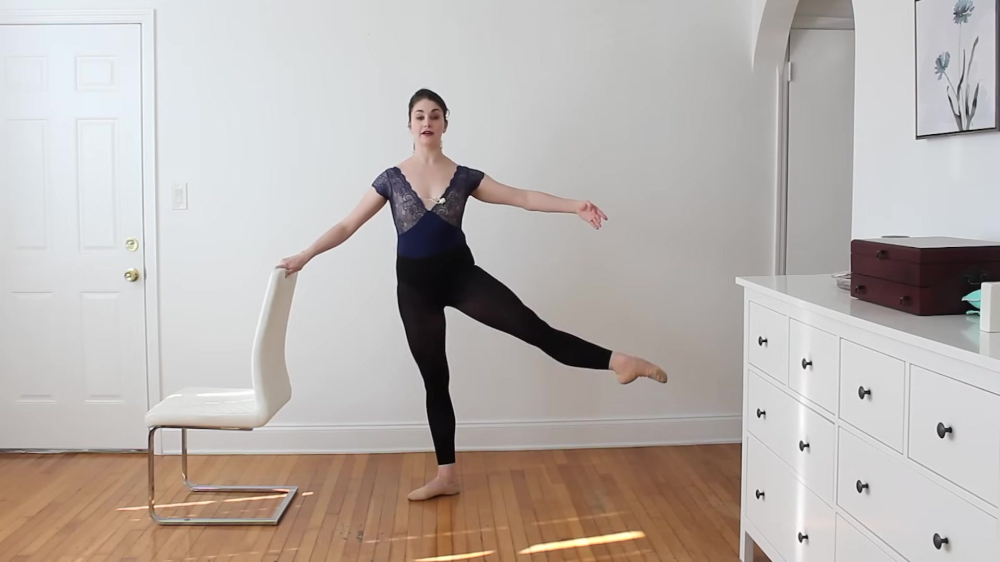

Class: beginner ballet class, Score: 15.3236, Path: /Users/riverfog7/Workspace/AISogang/AudioCLIP/dataset/beginner ballet class/0/frames/video_18.jpg


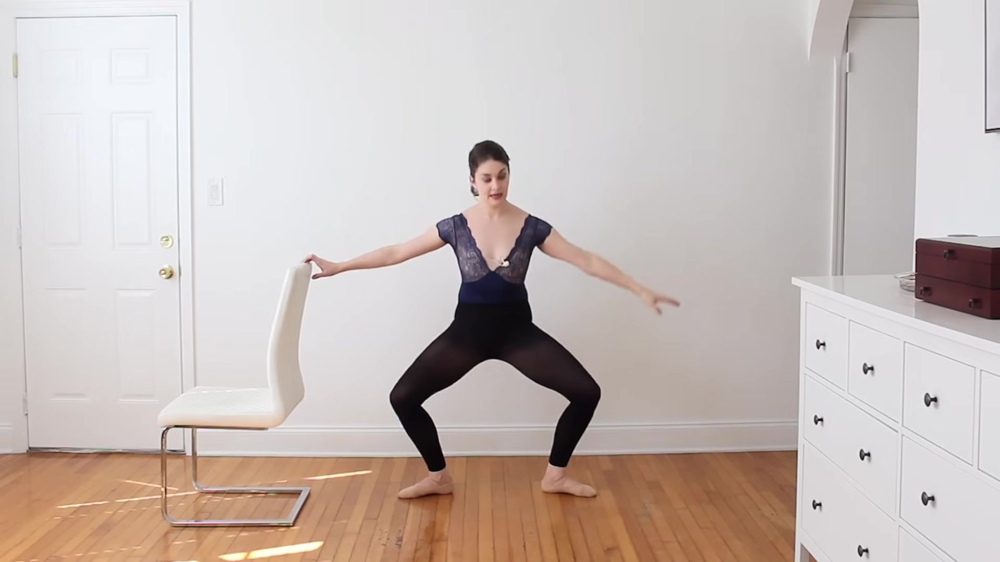

Class: hatha yoga poses, Score: 14.8960, Path: /Users/riverfog7/Workspace/AISogang/AudioCLIP/dataset/hatha yoga poses/0/frames/video_0.jpg


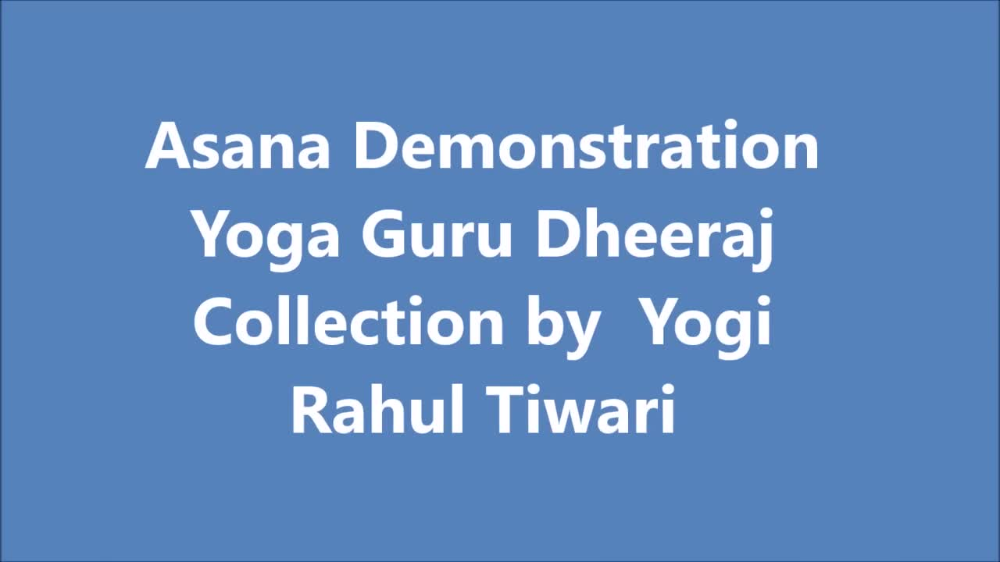

Class: yin yoga relaxation, Score: 14.6631, Path: /Users/riverfog7/Workspace/AISogang/AudioCLIP/dataset/yin yoga relaxation/0/frames/video_88.jpg


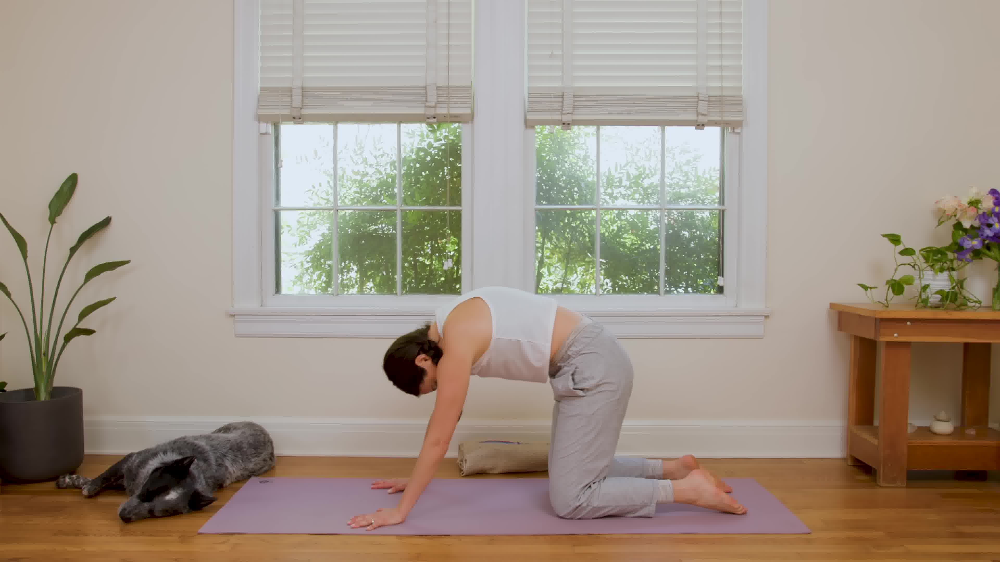

Class: yin yoga relaxation, Score: 14.5606, Path: /Users/riverfog7/Workspace/AISogang/AudioCLIP/dataset/yin yoga relaxation/0/frames/video_86.jpg


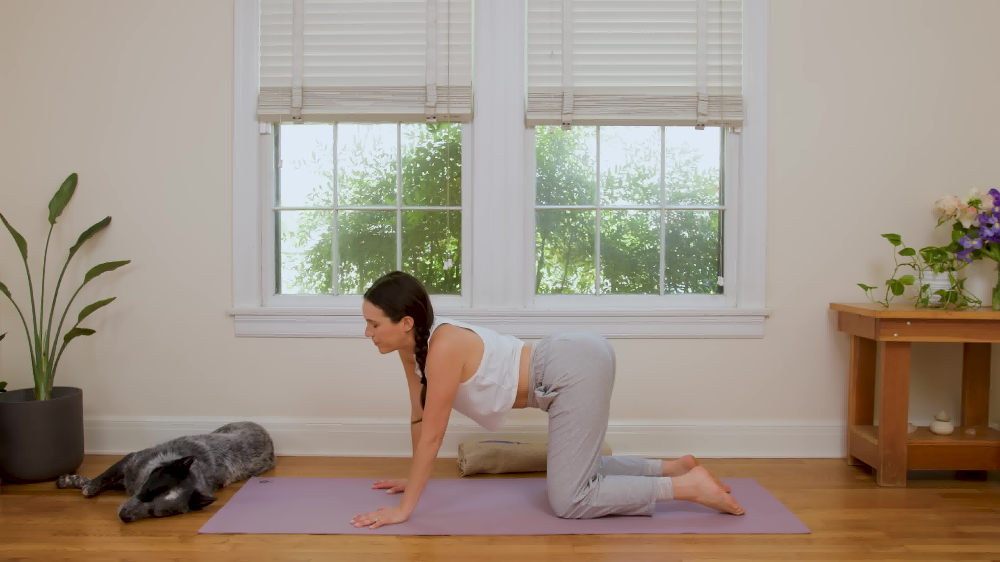

In [28]:
grab_images("yoga", k=5)

In [29]:
grab_audio("water")

Class: swim strokes tutorial, Score: 9.7631, Path: /Users/riverfog7/Workspace/AISogang/AudioCLIP/dataset/swim strokes tutorial/0/audio/video_15.wav


Class: kids swimming lessons, Score: 9.5948, Path: /Users/riverfog7/Workspace/AISogang/AudioCLIP/dataset/kids swimming lessons/0/audio/video_109.wav


#### Visualization of Likelyness throughout a Video

In [30]:
VIDEO_PATH = dataset_base / "electric guitar solo live" / "0"
vid_data = VideoData(VIDEO_PATH, model, device)

In [31]:
temp = vid_data.search_top_k(embed_text("a person playing a guitar"), k=200, modality='all')
audio = sorted(temp['audio'], key=lambda x: int(str(x[0]).split('_')[-1].split('.')[0]))
frames = sorted(temp['frame'], key=lambda x: int(str(x[0]).split('_')[-1].split('.')[0]))

In [32]:
# Draw graph of audio and frame scores over time
# Use a line plot with markers for each segment
audio_scores = [score for _, score in audio]
frame_scores = [score for _, score in frames]
time_axis = [val*1 for val in list(range(len(audio_scores)))]

fig = go.Figure()
fig.add_trace(go.Scatter(x=time_axis, y=audio_scores, mode='lines+markers', name='Audio Scores'))
fig.add_trace(go.Scatter(x=time_axis, y=frame_scores, mode='lines+markers', name='Frame Scores'))
fig.update_layout(title='Semantic Similarity Scores Over Time',
                  xaxis_title='Segment Index',
                  yaxis_title='Similarity Score',
                  legend_title='Legend',
                  width=800, height=500)
fig.show()